In [1]:
import os, uuid
import azure
from azure.identity import DefaultAzureCredential
from azure.storage.blob import BlobServiceClient, BlobClient, ContainerClient
import pandas as pd
import numpy as np
import openpyxl
from azure.storage.blob import BlobServiceClient
import time

In [2]:
STORAGEACCOUNTURL= "https://bdousncvbaddmv01sta.blob.core.windows.net"
STORAGEACCOUNTKEY= "JhbiDWfvxlthZngR4WkZDaaxhE/QMWj8bIXvdNH8MTvHYxNoSRq88UifxDawqeMlVpYuR3vpokQi52Ek1Ccqsw=="
CONTAINERNAME= "newcontainer"

def download_csv_from_cloud_storage(LOCALFILENAME, BLOBNAME, HEADER):
    """
    Function to load csv file from Azure Blob Storage into Pandas Dataframe.

        Inputs: {'LOCALFILENAME': path to local temporary destination (string), 'BLOBNAME': name of storage object we would like to call (string), 'HEADER': number of rows to be considered for header (int)},
        Outputs: {'sample_merge_lookup_all': Dataframe from input Blob Object}
    """
    # Download File from blob and save as Temp File
    t1=time.time()
    blob_service_client_instance = BlobServiceClient(account_url=STORAGEACCOUNTURL, credential=STORAGEACCOUNTKEY)
    blob_client_instance = blob_service_client_instance.get_blob_client(CONTAINERNAME, BLOBNAME, snapshot=None)
    with open(LOCALFILENAME, "wb") as my_blob:
        blob_data = blob_client_instance.download_blob()
        blob_data.readinto(my_blob)
    t2=time.time()
    print(("It takes %s seconds to download "+BLOBNAME) % (t2 - t1))


    # Read In Data Frame
    df = pd.read_csv(LOCALFILENAME, header=HEADER)
    # Remove Temporary File
    os.remove(LOCALFILENAME)
    return df

def download_pipe_from_cloud_storage(LOCALFILENAME, BLOBNAME, HEADER):
    """
    Function to load csv file from Azure Blob Storage into Pandas Dataframe.

        Inputs: {'LOCALFILENAME': path to local temporary destination (string), 'BLOBNAME': name of storage object we would like to call (string), 'HEADER': number of rows to be considered for header (int)},
        Outputs: {'df': Dataframe from input Blob Object}
    """
    
    # Download File from blob and save as Temp File
    t1=time.time()
    blob_service_client_instance = BlobServiceClient(account_url=STORAGEACCOUNTURL, credential=STORAGEACCOUNTKEY)
    blob_client_instance = blob_service_client_instance.get_blob_client(CONTAINERNAME, BLOBNAME, snapshot=None)
    with open(LOCALFILENAME, "wb") as my_blob:
        blob_data = blob_client_instance.download_blob()
        blob_data.readinto(my_blob)
    t2=time.time()
    print(("It takes %s seconds to download "+BLOBNAME) % (t2 - t1))


    # Read In Data Frame
    df = pd.read_csv(LOCALFILENAME, header=HEADER, sep = '|')
    # Remove Temporary File
    os.remove(LOCALFILENAME)
    return df

def download_excel_from_cloud_storage(LOCALFILENAME, BLOBNAME, HEADER, SHEETNAME):
    """
    Function to load csv file from Azure Blob Storage into Pandas Dataframe.

        Inputs: {'LOCALFILENAME': path to local temporary destination (string), 'BLOBNAME': name of storage object we would like to call (string), 'HEADER': number of rows to be considered for header (int), 'SHEETNAME': name of tab in Excel workbook which data resides},
        Outputs: {'df': Dataframe from input Blob Object}
    """
    # Download File from blob and save as Temp File
    t1=time.time()
    blob_service_client_instance = BlobServiceClient(account_url=STORAGEACCOUNTURL, credential=STORAGEACCOUNTKEY)
    blob_client_instance = blob_service_client_instance.get_blob_client(CONTAINERNAME, BLOBNAME, snapshot=None)
    with open(LOCALFILENAME, "wb") as my_blob:
        blob_data = blob_client_instance.download_blob()
        blob_data.readinto(my_blob)
    t2=time.time()
    print(("It takes %s seconds to download "+BLOBNAME) % (t2 - t1))

    # Read In Data Frame
    df = pd.read_excel(LOCALFILENAME, header=HEADER, sheet_name=SHEETNAME)
    # Remove Temporary File
    os.remove(LOCALFILENAME)
    return df

In [84]:
census_2022 = download_csv_from_cloud_storage('temp_df', "CensusFlatFile2022.csv", None)
census_2022.columns = census_2022.columns+1
census_2022

It takes 7.104017019271851 seconds to download CensusFlatFile2022.csv


<ipython-input-84-b0bcc5594f51>:1: DtypeWarning: Columns (15,16,17,18,21) have mixed types.Specify dtype option on import or set low_memory=False.
  census_2022 = download_csv_from_cloud_storage('temp_df', "CensusFlatFile2022.csv", None)


1      2     3     4       5     6    7    8    9     10       11    \
0      2022  33860     1     1   20100     0    T    N    D   NaN  68115.0   
1      2022  33860     1     1   20200     0    T    N    D   NaN  68115.0   
2      2022  33860     1     1   20300     0    T    N    D   NaN  68115.0   
3      2022  33860     1     1   20400     0    T    N    D   NaN  68115.0   
4      2022  33860     1     1   20501     0    T    N    D   NaN  68115.0   
...     ...    ...   ...   ...     ...   ...  ...  ...  ...   ...      ...   
87270  2022  99999    78    30  960900     0    I    N    I   NaN      NaN   
87271  2022  99999    78    30  961000     0    I    N    I   NaN      NaN   
87272  2022  99999    78    30  961100     0    I    N    I   NaN      NaN   
87273  2022  99999    78    30  961200     0    I    N    I   NaN      NaN   
87274  2022  99999    78    30  990000     0    I    N    I   NaN      NaN   

          12      13     14    15   16   17   18   19    20    21   22    \
0      54250.0  103.79  75500   3.0  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
1      54250.0   73.60  75500   2.0  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
2      54250.0  102.93  75500   3.0  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
3      54250.0  110.95  75500   3.0  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
4      54250.0  133.41  75500   4.0  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
...        ...     ...    ...   ...  ...  ...  ...  ...   ...   ...  ...   
87270      NaN     NaN  66400   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
87271      NaN     NaN  66400   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
87272      NaN     NaN  66400   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
87273      NaN     NaN  66400   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN   
87274      NaN     NaN  66400   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN   

         23      24      25      26      27      28     29      30     31    \
0      1775.0   555.0   693.0   963.0   978.0   399.0  22.48  1775.0   76.0   
1      2055.0   359.0   573.0   747.0  1010.0  1221.0  59.42  2055.0   43.0   
2      3216.0   975.0  1351.0  1855.0  1839.0   996.0  30.97  3216.0  100.0   
3      4246.0  1137.0  1636.0  1745.0  1794.0   724.0  17.05  4246.0  158.0   
4      4322.0  1278.0  1706.0  2117.0  2189.0  1111.0  25.71  4322.0  156.0   
...       ...     ...     ...     ...     ...     ...    ...     ...    ...   
87270     NaN     NaN     NaN     NaN     NaN     NaN    NaN     NaN    NaN   
87271     NaN     NaN     NaN     NaN     NaN     NaN    NaN     NaN    NaN   
87272     NaN     NaN     NaN     NaN     NaN     NaN    NaN     NaN    NaN   
87273     NaN     NaN     NaN     NaN     NaN     NaN    NaN     NaN    NaN   
87274     NaN     NaN     NaN     NaN     NaN     NaN    NaN     NaN    NaN   

         32      33      34      35    36    37    38    39     40     41    \
0      1699.0  1608.0  1376.0   213.0   5.0   8.0   0.0   6.0   91.0   84.0   
1      2012.0  1952.0   834.0  1098.0   2.0  12.0   1.0   5.0   60.0   57.0   
2      3116.0  2974.0  2220.0   714.0   7.0  14.0   5.0  14.0  142.0  137.0   
3      4088.0  3897.0  3522.0   320.0  17.0  32.0   1.0   5.0  191.0  185.0   
4      4166.0  3962.0  3211.0   628.0  23.0  93.0   2.0   5.0  204.0  197.0   
...       ...     ...     ...     ...   ...   ...   ...   ...    ...    ...   
87270     NaN     NaN     NaN     NaN   NaN   NaN   NaN   NaN    NaN    NaN   
87271     NaN     NaN     NaN     NaN   NaN   NaN   NaN   NaN    NaN    NaN   
87272     NaN     NaN     NaN     NaN   NaN   NaN   NaN   NaN    NaN    NaN   
87273     NaN     NaN     NaN     NaN   NaN   NaN   NaN   NaN    NaN    NaN   
87274     NaN     NaN     NaN     NaN   NaN   NaN   NaN   NaN    NaN    NaN   

       42    43    44    45    46    47      48     49     50    51    52    \
0      14.0  34.0  13.0   9.0   9.0   0.0   227.0   39.0   21.0   9.0  15.0   
1      24.0  10.0   3.0   0.0   8.0   4.0  1122.0   12.0   15.0   1.0  13.0   
2      36.0  65.0   9.

In [85]:
census_2022_dd = download_excel_from_cloud_storage('temp_df', "FFIEC_Census_File_Definitions_26AUG22.xlsx", 0, "Data Dictionary")
census_2022_dd.Index = census_2022_dd.Index.fillna(0).astype(int)
census_2022_dd = census_2022_dd.set_index('Index')
census_2022_dd

It takes 0.05399608612060547 seconds to download FFIEC_Census_File_Definitions_26AUG22.xlsx


,Description,Max Length,Data Type,Data Source,Source Field
Index,,,,,
0,Other - Board calculated,NaN,NaN,NaN,NaN
1,Key field. HMDA/CRA collection year,4.0,AN,Other,NaN
2,Key field. MSA/MD Code,5.0,AN,Other,NaN
3,Key field. FIPS state code,2.0,AN,Other,NaN
4,Key field. FIPS county code,3.0,AN,Other,NaN
...,...,...,...,...,...
1210,"Total owner-occupied units $1,500,000 to $1,99...",8.0,N,ACS,B25075_026
1211,"Total owner-occupied units $2,000,000 or more",8.0,N,ACS,B25075_027
0,NaN,NaN,NaN,NaN,NaN


In [86]:
new_col_list = []
for col in census_2022.columns:
    new_col_list.append(census_2022_dd.loc[col].Description)

In [87]:
census_2022.columns = new_col_list
census_2022.columns = census_2022.columns.str.lstrip('Key field. ')

### UPDATE: Need to get this showing as the 11 digit Census tract. We can convert to integer if needed, but safer to leave as full 11 digit string.
# Concatenate 'FIPS state code' (length: 2), 'FIPS county code' (length: 3), and 'Census tract' (length: 6)

census_2022['census_tract_merge'] = (census_2022['FIPS state code'].astype(str).str.pad(width=2, side='left', fillchar='0') + 
                                    census_2022['FIPS county code'].astype(str).str.pad(width=3, side='left', fillchar='0') + 
                                    census_2022['Census tract. Implied decimal point.'].astype(str).str.pad(width=6, side='left', fillchar='0'))
census_2022

HMDA/CRA collection year  MSA/MD Code  FIPS state code  \
0                          2022        33860                1   
1                          2022        33860                1   
2                          2022        33860                1   
3                          2022        33860                1   
4                          2022        33860                1   
...                         ...          ...              ...   
87270                      2022        99999               78   
87271                      2022        99999               78   
87272                      2022        99999               78   
87273                      2022        99999               78   
87274                      2022        99999               78   

       FIPS county code  Census tract. Implied decimal point.  \
0                     1                                 20100   
1                     1                                 20200   
2                     1                                 20300   
3                     1                                 20400   
4                     1                                 20501   
...                 ...                                   ...   
87270                30                                960900   
87271                30                                961000   
87272                30                                961100   
87273                30                                961200   
87274                30                                990000   

       Principal city flag. 0=not principal city, 1=principal city  \
0                                                      0             
1                                                      0             
2                                                      0             
3                                                      0             
4                                                      0             
...                                                  ...             
87270                                                  0             
87271                                                  0             
87272                                                  0             
87273                                                  0             
87274                                                  0             

      Small county flag. T=tract record, S=small county, I=island area  \
0                                                      T                 
1                                                      T                 
2                                                      T                 
3                                                      T                 
4                                                      T                 
...                                                  ...                 
87270                                                  I                 
87271                                                  I                 
87272                                                  I                 
87273                                                  I                 
87274                                                  I                 

      Split tract flag. N=tract number occurs within one MA, S=split between Mas  \
0                                                      N                           
1                                                      N                           
2                                                      N                           
3                                                      N                           
4                                                      N                           
...                                                  ...                           
87270                                                  N                           
87271                                      

In [82]:
census_2022['FIPS state code'].astype(str).str.pad(width=2, side='left', fillchar='0') + census_2022['FIPS county code'].astype(str).str.pad(width=3, side='left', fillchar='0') + census_2022['Census tract. Implied decimal point.'].astype(str).str.pad(width=6, side='left', fillchar='0')

0        01001020100
1        01001020200
2        01001020300
3        01001020400
4        01001020501
            ...     
87270    78030960900
87271    78030961000
87272    78030961100
87273    78030961200
87274    78030990000
Length: 87275, dtype: object

In [92]:
hmda = download_csv_from_cloud_storage('temp_df', "2021_public_lar_pa.csv", 0)
print(f'census tract 1 unaltered: {hmda.census_tract[0]}')
print(f'census tract 1 cast as int: {hmda.census_tract[0].astype(int)}')
print(f'census tract 1 cast as np.int64: {hmda.census_tract[0].astype(np.int64)}')
hmda.census_tract = hmda.census_tract.fillna(0).astype(np.int64)
hmda = hmda[hmda['census_tract']!=0]
hmda['census_tract_merge'] = hmda.census_tract.astype(str).str.pad(width=3, side='left', fillchar='0')
hmda

It takes 0.3220040798187256 seconds to download 2021_public_lar_pa.csv


<ipython-input-92-4ac292945103>:1: DtypeWarning: Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types.Specify dtype option on import or set low_memory=False.
  hmda = download_csv_from_cloud_storage('temp_df', "2021_public_lar_pa.csv", 0)


census tract 1 unaltered: 42101030900.0
census tract 1 cast as int: -2147483648
census tract 1 cast as np.int64: 42101030900


,activity_year,lei,derived_msa_md,state_code,county_code,census_tract,conforming_loan_limit,derived_loan_product_type,derived_dwelling_category,derived_ethnicity,derived_race,derived_sex,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,reverse_mortgage,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,combined_loan_to_value_ratio,interest_rate,rate_spread,hoepa_status,total_loan_costs,total_points_and_fees,origination_charges,discount_points,lender_credits,loan_term,prepayment_penalty_term,intro_rate_period,negative_amortization,interest_only_payment,balloon_payment,other_nonamortizing_features,property_value,construction_method,occupancy_type,manufactured_home_secured_property_type,manufactured_home_land_property_interest,total_units,multifamily_affordable_units,income,debt_to_income_ratio,applicant_credit_score_type,co_applicant_credit_score_type,applicant_ethnicity_1,applicant_ethnicity_2,applicant_ethnicity_3,applicant_ethnicity_4,applicant_ethnicity_5,co_applicant_ethnicity_1,co_applicant_ethnicity_2,co_applicant_ethnicity_3,co_applicant_ethnicity_4,co_applicant_ethnicity_5,applicant_ethnicity_observed,co_applicant_ethnicity_observed,applicant_race_1,applicant_race_2,applicant_race_3,applicant_race_4,applicant_race_5,co_applicant_race_1,co_applicant_race_2,co_applicant_race_3,co_applicant_race_4,co_applicant_race_5,applicant_race_observed,co_applicant_race_observed,applicant_sex,co_applicant_sex,applicant_sex_observed,co_applicant_sex_observed,applicant_age,co_applicant_age,applicant_age_above_62,co_applicant_age_above_62,submission_of_application,initially_payable_to_institution,aus_1,aus_2,aus_3,aus_4,aus_5,denial_reason_1,denial_reason_2,denial_reason_3,denial_reason_4,tract_population,tract_minority_population_percent,ffiec_msa_md_median_family_income,tract_to_msa_income_percentage,tract_owner_occupied_units,tract_one_to_four_family_homes,tract_median_age_of_housing_units,census_tract_merge
0,2021,549300KDVJICP5T5BD05,37964,PA,42101.0,42101030900,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Female,3,0,2,1,31,1,2,2,2,145000,70.443,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,180.0,NaN,NaN,2,2,2,2,205000.0,1,1,3,5,1,NaN,37.0,20%-<30%,8,10,2.0,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,2,4,3,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,2,4,2,5,2,4,45-54,9999,No,NaN,1,1,6,NaN,NaN,NaN,NaN,9,4.0,NaN,NaN,4507,84.14,67500,69,646,1246,62,42101030900
1,2021,549300KDVJICP5T5BD05,33874,PA,42029.0,42029311700,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,White,Male,4,0,2,1,1,2,2,1,2,105000,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,180.0,NaN,3.0,2,2,2,2,NaN,1,1,3,5,1,NaN,190.0,NaN,9,9,2.0,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,2,4,5,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,2,4,1,5,2,4,55-64,9999,Yes,NaN,1,1,6,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,9662,37.73,116300,92,2406,3007,26,42029311700
2,2021,549300KDVJICP5T5BD05,37964,PA,42045.0,42045403300,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Male,3,0,2,1,4,2,2,2,2,35000,76.101,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,180.0,NaN,NaN,2,2,2,2,215000.0,1,1,3,5,1,NaN,136.0,>60%,8,10,2.0,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,2,4,3,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,2,4,1,5,2,4,25-34,9999,No,NaN,1,1,6,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,6658,32.37,67500,92,1409,2031,61,42045403300
3,2021,549300KDVJICP5T5BD05,10900,PA,42095.0,42095017800,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Male,3,0,2,1,2,2,2,1,2,35000,106.094,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,180.0,NaN,NaN,2,2,2,2,205000.0,1,1,3,5,1,NaN,90.0,20%-<30%,8,10,2.0,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,2,4,3,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,2,4,1,5,2,4,35-44,9999,No,NaN,1,1,6,NaN,NaN,NaN,NaN,9,4.0,NaN,NaN,2618,41.37,84900,85,637,1021,53,42095017800
4,2021,54930063XGNMIXS57091,37964,PA,42101.0,42101027100,C,Conventional:Sub

In [93]:
### Merging
# Sample of Census Data Columns
sample_census = census_2022[census_2022['FIPS state code'] == 42]

cols_census = [
        'census_tract_merge', 
        'MSA/MD median family income', 
        'MSA/MD median household income',
        'Tract median family income as a percentage of the MSA/MD median family income. 2 decimal places, truncated.', 
        'FFIEC Estimated MSA/MD median family income',
        'Income indicator, which identifies low, moderate, middle, and upper income areas',
        '''CRA poverty criteria. 'X' - Yes , ' ' (blank space) - No''',
        '''CRA unemployment criteria. 'X' - Yes , ' ' (blank space) - No''',
        'Minority population as percent of tract population rounded to two decimal places',
        'Total population White', 
        'Total population Black/African American', 
        'Total population American Indian or Alaska native', 
        'Total population Asian', 
        'Total population Native Hawaiian or other Pacific Islander', 
        'Total population some other race', 
        'Total housing units', 
        'Total housing units - urban   ', 
        'Total housing units - rural', 
        'Total occupied housing units', 
        'Total vacant housing units'
        ]

cols_census_dict = {
        'census_tract_merge': 'census_tract_merge', 
        'MSA/MD median family income': 'msa_med_family_income', 
        'MSA/MD median household income': 'msa_med_household_income',
        'Tract median family income as a percentage of the MSA/MD median family income. 2 decimal places, truncated.': 'pct_tract_msa_med_fam_income', 
        'FFIEC Estimated MSA/MD median family income': 'ffiec_est_msa_med_fam_income',
        'Income indicator, which identifies low, moderate, middle, and upper income areas': 'income_category',
        '''CRA poverty criteria. 'X' - Yes , ' ' (blank space) - No''': 'cra_poverty',
        '''CRA unemployment criteria. 'X' - Yes , ' ' (blank space) - No''': 'cra_unemployment',
        'Minority population as percent of tract population rounded to two decimal places': 'minority_pct_of_tract',
        'Total population White': 'total_pop_white', 
        'Total population Black/African American': 'total_pop_black', 
        'Total population American Indian or Alaska native': 'total_pop_aioan', 
        'Total population Asian': 'total_pop_asian', 
        'Total population Native Hawaiian or other Pacific Islander': 'total_pop_nhopi', 
        'Total population some other race': 'total_pop_other', 
        'Total housing units': 'total_hus', 
        'Total housing units - urban   ': 'total_hus_urban', 
        'Total housing units - rural': 'total_hus_rural', 
        'Total occupied housing units': 'total_hus_occupied', 
        'Total vacant housing units': 'total_hus_vacant'
}
sample_census = census_2022[cols_census]
sample_census = sample_census.rename(columns=cols_census_dict)

# Sample of HMDA Cols

cols_hmda = [
        'census_tract_merge', 
        'lei',
        'derived_msa_md',
        'conforming_loan_limit',
        'derived_loan_product_type',
        'derived_dwelling_category',
        'derived_ethnicity',
        'derived_race',
        'derived_sex',
        'action_taken',
        'purchaser_type',
        'preapproval',
        'loan_type',
        'loan_purpose',
        'lien_status',
        'open_end_line_of_credit',
        'business_or_commercial_purpose',
        'loan_amount',
        'combined_loan_to_value_ratio',
        'interest_rate',
        'rate_spread',
        'hoepa_status',
        'total_loan_costs',
        'property_value',
        'income',
        'debt_to_income_ratio',
        'applicant_credit_score_type',
        'applicant_age'
]
sample_hmda = hmda[cols_hmda]

In [94]:
pd.set_option('display.max_columns', None)
sample_merge = sample_hmda.merge(sample_census, on = 'census_tract_merge', how='left')
sample_merge.head()

,census_tract_merge,lei,derived_msa_md,conforming_loan_limit,derived_loan_product_type,derived_dwelling_category,derived_ethnicity,derived_race,derived_sex,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,combined_loan_to_value_ratio,interest_rate,rate_spread,hoepa_status,total_loan_costs,property_value,income,debt_to_income_ratio,applicant_credit_score_type,applicant_age,msa_med_family_income,msa_med_household_income,pct_tract_msa_med_fam_income,ffiec_est_msa_med_fam_income,income_category,cra_poverty,cra_unemployment,minority_pct_of_tract,total_pop_white,total_pop_black,total_pop_aioan,total_pop_asian,total_pop_nhopi,total_pop_other,total_hus,total_hus_urban,total_hus_rural,total_hus_occupied,total_hus_vacant
0,42101030900,549300KDVJICP5T5BD05,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Female,3,0,2,1,31,1,2,2,145000,70.443,NaN,NaN,3,NaN,205000.0,37.0,20%-<30%,8,45-54,68458.0,54520.0,72.62,75000.0,2.0,NaN,NaN,83.39,781.0,1686.0,1.0,644.0,0.0,590.0,1454.0,NaN,NaN,1405.0,49.0
1,42029311700,549300KDVJICP5T5BD05,33874,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,White,Male,4,0,2,1,1,2,1,2,105000,NaN,NaN,NaN,3,NaN,NaN,190.0,NaN,9,55-64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,42045403300,549300KDVJICP5T5BD05,37964,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Male,3,0,2,1,4,2,2,2,35000,76.101,NaN,NaN,3,NaN,215000.0,136.0,>60%,8,25-34,68458.0,54520.0,99.68,75000.0,3.0,NaN,NaN,41.59,4084.0,1901.0,8.0,235.0,0.0,197.0,2854.0,NaN,NaN,2542.0,312.0
3,42095017800,549300KDVJICP5T5BD05,10900,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Male,3,0,2,1,2,2,1,2,35000,106.094,NaN,NaN,3,NaN,205000.0,90.0,20%-<30%,8,35-44,84676.0,69769.0,103.38,94300.0,3.0,NaN,NaN,53.98,1545.0,421.0,20.0,54.0,7.0,411.0,1231.0,NaN,NaN,1184.0,47.0
4,42101027100,54930063XGNMIXS57091,37964,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Joint,3,0,2,1,32,2,1,2,35000,18.717,NaN,NaN,3,NaN,185000.0,76.0,<20%,9,55-64,68458.0,54520.0,73.62,75000.0,2.0,NaN,NaN,96.01,113.0,1471.0,11.0,544.0,1.0,102.0,1001.0,NaN,NaN,968.0,33.0


In [111]:
sample_merge_clean = sample_merge[sample_merge.minority_pct_of_tract.notnull()]

def conditions(s):
    if (s['minority_pct_of_tract'] >= 50) and (s['pct_tract_msa_med_fam_income'] < 100):
        return 1
    else:
        return 0


sample_merge_clean['minority_census_tract'] = sample_merge_clean.apply(conditions, axis=1)

minority_tracts = sample_merge_clean[sample_merge_clean['minority_census_tract'] == 1]
minority_tracts.head()

<ipython-input-111-9b624582f730>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_merge_clean['minority_census_tract'] = sample_merge_clean.apply(conditions, axis=1)


,census_tract_merge,lei,derived_msa_md,conforming_loan_limit,derived_loan_product_type,derived_dwelling_category,derived_ethnicity,derived_race,derived_sex,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,combined_loan_to_value_ratio,interest_rate,rate_spread,hoepa_status,total_loan_costs,property_value,income,debt_to_income_ratio,applicant_credit_score_type,applicant_age,msa_med_family_income,msa_med_household_income,pct_tract_msa_med_fam_income,ffiec_est_msa_med_fam_income,income_category,cra_poverty,cra_unemployment,minority_pct_of_tract,total_pop_white,total_pop_black,total_pop_aioan,total_pop_asian,total_pop_nhopi,total_pop_other,total_hus,total_hus_urban,total_hus_rural,total_hus_occupied,total_hus_vacant,minority_census_tract
0,42101030900,549300KDVJICP5T5BD05,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Female,3,0,2,1,31,1,2,2,145000,70.443,NaN,NaN,3,NaN,205000.0,37.0,20%-<30%,8,45-54,68458.0,54520.0,72.62,75000.0,2.0,NaN,NaN,83.39,781.0,1686.0,1.0,644.0,0.0,590.0,1454.0,NaN,NaN,1405.0,49.0,1
4,42101027100,54930063XGNMIXS57091,37964,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Joint,3,0,2,1,32,2,1,2,35000,18.717,NaN,NaN,3,NaN,185000.0,76.0,<20%,9,55-64,68458.0,54520.0,73.62,75000.0,2.0,NaN,NaN,96.01,113.0,1471.0,11.0,544.0,1.0,102.0,1001.0,NaN,NaN,968.0,33.0,1
9,42101034900,54930063XGNMIXS57091,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,White,Male,5,0,2,1,32,1,2,2,225000,NaN,NaN,NaN,3,NaN,NaN,75.0,NaN,9,45-54,68458.0,54520.0,98.77,75000.0,3.0,NaN,NaN,53.94,2861.0,1398.0,24.0,435.0,2.0,500.0,2283.0,NaN,NaN,2030.0,253.0,1
11,42101028200,54930063XGNMIXS57091,37964,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Male,3,0,2,1,2,2,2,1,35000,16.115,NaN,NaN,3,NaN,205000.0,48.0,20%-<30%,2,65-74,68458.0,54520.0,66.49,75000.0,2.0,NaN,NaN,96.64,187.0,3895.0,10.0,258.0,3.0,181.0,2260.0,NaN,NaN,2044.0,216.0,1
18,42101020300,54930063XGNMIXS57091,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Female,5,0,2,1,2,1,1,2,65000,NaN,NaN,NaN,3,NaN,NaN,82.0,NaN,9,65-74,68458.0,54520.0,61.45,75000.0,2.0,NaN,NaN,97.31,140.0,2188.0,11.0,19.0,0.0,238.0,1343.0,NaN,NaN,1094.0,249.0,1


In [118]:

sample_merge_clean = sample_merge[sample_merge.minority_pct_of_tract.notnull()]

def map_income(df):
    if df['income'] >= 0 and df['income'] <= 25:
        return '$0-$25k'
    elif df['income'] > 25 and df['income'] <= 50:
        return '$25k-$50k'
    elif df['income'] > 50 and df['income'] <= 100:
        return '$50k-$100k'
    elif df['income'] > 100 and df['income'] <= 150:
        return '$100k-$150k'
    elif df['income'] > 150 and df ['income'] <= 250:
        return '$150k-$250k'
    else:
        return '>$250k'

sample_merge_clean.income = sample_merge_clean.income.fillna(0)

sample_merge_clean['income_bin'] = sample_merge_clean.apply(map_income, axis=1)

def minority_tract_conditions(df):
    if (df['minority_pct_of_tract'] >= 50) and (df['pct_tract_msa_med_fam_income'] < 100):
        return 1
    else:
        return 0


sample_merge_clean['minority_census_tract'] = sample_merge_clean.apply(minority_tract_conditions, axis=1)

minority_tracts = sample_merge_clean[sample_merge_clean['minority_census_tract'] == 1]
minority_tracts.head()

C:\Miniconda\lib\site-packages\pandas\core\generic.py:5507: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
<ipython-input-118-cfc791a0f967>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_merge_clean['income_bin'] = sample_merge_clean.apply(map_income, axis=1)
<ipython-input-118-cfc791a0f967>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

,census_tract_merge,lei,derived_msa_md,conforming_loan_limit,derived_loan_product_type,derived_dwelling_category,derived_ethnicity,derived_race,derived_sex,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,combined_loan_to_value_ratio,interest_rate,rate_spread,hoepa_status,total_loan_costs,property_value,income,debt_to_income_ratio,applicant_credit_score_type,applicant_age,msa_med_family_income,msa_med_household_income,pct_tract_msa_med_fam_income,ffiec_est_msa_med_fam_income,income_category,cra_poverty,cra_unemployment,minority_pct_of_tract,total_pop_white,total_pop_black,total_pop_aioan,total_pop_asian,total_pop_nhopi,total_pop_other,total_hus,total_hus_urban,total_hus_rural,total_hus_occupied,total_hus_vacant,income_bin,minority_census_tract
0,42101030900,549300KDVJICP5T5BD05,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Female,3,0,2,1,31,1,2,2,145000,70.443,NaN,NaN,3,NaN,205000.0,37.0,20%-<30%,8,45-54,68458.0,54520.0,72.62,75000.0,2.0,NaN,NaN,83.39,781.0,1686.0,1.0,644.0,0.0,590.0,1454.0,NaN,NaN,1405.0,49.0,$25k-$50k,1
4,42101027100,54930063XGNMIXS57091,37964,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Joint,3,0,2,1,32,2,1,2,35000,18.717,NaN,NaN,3,NaN,185000.0,76.0,<20%,9,55-64,68458.0,54520.0,73.62,75000.0,2.0,NaN,NaN,96.01,113.0,1471.0,11.0,544.0,1.0,102.0,1001.0,NaN,NaN,968.0,33.0,$50k-$100k,1
9,42101034900,54930063XGNMIXS57091,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,White,Male,5,0,2,1,32,1,2,2,225000,NaN,NaN,NaN,3,NaN,NaN,75.0,NaN,9,45-54,68458.0,54520.0,98.77,75000.0,3.0,NaN,NaN,53.94,2861.0,1398.0,24.0,435.0,2.0,500.0,2283.0,NaN,NaN,2030.0,253.0,$50k-$100k,1
11,42101028200,54930063XGNMIXS57091,37964,C,Conventional:Subordinate Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Male,3,0,2,1,2,2,2,1,35000,16.115,NaN,NaN,3,NaN,205000.0,48.0,20%-<30%,2,65-74,68458.0,54520.0,66.49,75000.0,2.0,NaN,NaN,96.64,187.0,3895.0,10.0,258.0,3.0,181.0,2260.0,NaN,NaN,2044.0,216.0,$25k-$50k,1
18,42101020300,54930063XGNMIXS57091,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Black or African American,Female,5,0,2,1,2,1,1,2,65000,NaN,NaN,NaN,3,NaN,NaN,82.0,NaN,9,65-74,68458.0,54520.0,61.45,75000.0,2.0,NaN,NaN,97.31,140.0,2188.0,11.0,19.0,0.0,238.0,1343.0,NaN,NaN,1094.0,249.0,$50k-$100k,1


In [130]:
sample_merge_clean.interest_rate = sample_merge_clean.interest_rate.replace('Exempt', np.nan)
sample_merge_clean = sample_merge_clean[sample_merge_clean['interest_rate'].notnull()]
sample_merge_clean.interest_rate = sample_merge_clean.interest_rate.astype(np.float64)

national_average_lookup = sample_merge_clean.groupby(['census_tract_merge', 'income_bin']).mean().reset_index()
national_average_lookup = national_average_lookup.rename(columns = {'interest_rate': 'average_interest_rate','minority_census_tract': 'avg_minority_census_tract'})
national_average_lookup

,census_tract_merge,income_bin,derived_msa_md,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,average_interest_rate,hoepa_status,income,applicant_credit_score_type,msa_med_family_income,msa_med_household_income,pct_tract_msa_med_fam_income,ffiec_est_msa_med_fam_income,income_category,minority_pct_of_tract,total_pop_white,total_pop_black,total_pop_aioan,total_pop_asian,total_pop_nhopi,total_pop_other,total_hus,total_hus_urban,total_hus_rural,total_hus_occupied,total_hus_vacant,avg_minority_census_tract
0,42001030101,$100k-$150k,23900.0,1.0,71.000000,2.0,1.000000,31.000000,1.0,2.0,2.0,155000.0,2.250000,2.0,123.000000,1.0,84709.0,68411.0,100.28,90300.0,3.0,8.31,2450.0,12.0,4.0,9.0,1.0,59.0,1184.0,NaN,NaN,1081.0,103.0,0.0
1,42001030101,$50k-$100k,23900.0,1.0,3.000000,2.0,1.000000,32.000000,1.0,2.0,2.0,145000.0,2.625000,2.0,100.000000,3.0,84709.0,68411.0,100.28,90300.0,3.0,8.31,2450.0,12.0,4.0,9.0,1.0,59.0,1184.0,NaN,NaN,1081.0,103.0,0.0
2,42001030200,$0-$25k,23900.0,6.0,1.000000,2.0,1.000000,32.000000,1.0,2.0,2.0,205000.0,3.625000,2.0,0.000000,9.0,84709.0,68411.0,78.13,90300.0,2.0,18.65,4462.0,35.0,31.0,39.0,1.0,405.0,2165.0,NaN,NaN,2021.0,144.0,0.0
3,42001030200,$150k-$250k,23900.0,1.0,1.000000,2.0,1.000000,32.000000,1.0,2.0,2.0,195000.0,2.875000,2.0,170.000000,2.0,84709.0,68411.0,78.13,90300.0,2.0,18.65,4462.0,35.0,31.0,39.0,1.0,405.0,2165.0,NaN,NaN,2021.0,144.0,0.0
4,42001030200,$50k-$100k,23900.0,1.0,71.000000,2.0,1.500000,31.500000,1.0,2.0,2.0,235000.0,3.437500,2.0,85.500000,2.0,84709.0,68411.0,78.13,90300.0,2.0,18.65,4462.0,35.0,31.0,39.0,1.0,405.0,2165.0,NaN,NaN,2021.0,144.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7569,42133023902,$0-$25k,49620.0,6.0,3.000000,2.0,1.000000,32.000000,1.0,2.0,2.0,220000.0,2.812500,2.0,0.000000,9.0,82154.0,68940.0,115.56,93300.0,3.0,6.32,2784.0,21.0,0.0,8.0,0.0,17.0,1055.0,NaN,NaN,1008.0,47.0,0.0
7570,42133023902,$50k-$100k,49620.0,1.0,3.000000,2.0,1.000000,31.000000,1.0,2.0,2.0,105000.0,2.125000,2.0,100.000000,2.0,82154.0,68940.0,115.56,93300.0,3.0,6.32,2784.0,21.0,0.0,8.0,0.0,17.0,1055.0,NaN,NaN,1008.0,47.0,0.0
7571,42133024001,$100k-$150k,49620.0,1.0,2.666667,2.0,1.666667,31.666667,1.0,2.0,2.0,235000.0,2.583333,2.0,122.666667,3.0,82154.0,68940.0,97.70,93300.0,3.0,9.92,5148.0,74.0,20.0,21.0,5.0,46.0,2244.0,NaN,NaN,1851.0,393.0,0.0
7572,42133024001,$25k-$50k,49620.0,1.0,2.000000,2.0,3.000000,1.000000,1.0,2.0,2.0,245000.0,2.375000,2.0,49.000000,1.0,82154.0,68940.0,97.70,93300.0,3.0,9.92,5148.0,74.0,20.0,21.0,5.0,46.0,2244.0,NaN,NaN,1851.0,393.0,0.0


In [145]:
def compare_interest_to_national_average(df, lei, national_average_lookup):
    '''
    Compute pct difference in interest rate for all available census tracts within an LEI portfolio.
    Inputs: {
        'df': dataframe of hmda data merged with Census results,
        'lei': string value for lei of interest,
        'national_average_lookup': dataframe containing hmda data merged with Census results, grouped by Census Tract and income bin and aggregated by mean.
    },
    Outputs: {
        'df[cols]': dataframe containing lei, census_tract_merge, income_bin, interest_rate, average_interest_rate, pct_diff_interest_rate
    }
    '''

    #Subset df to just lei of interest
    if pd.isna(lei):
        df = df
    else:
        df = df[df.lei == lei]

    #Merge df with results of national average lookup on census_tract_merge and income_bin
    df = df.merge(national_average_lookup, on=['census_tract_merge', 'income_bin'], how='left')

    #Compute percent difference in interest rate
    df['pct_diff_interest_rate'] = (df.interest_rate - df.average_interest_rate)/df.average_interest_rate

    #Return dataframe with the following columns: lei, census_tract_merge, income_bin, interest_rate, average_interest_rate, pct_diff_interest_rate
    cols = [
        'lei', 
        'census_tract_merge', 
        'income_bin', 
        'interest_rate', 
        'average_interest_rate', 
        'pct_diff_interest_rate',
        'minority_census_tract'
    ]

    return df[cols]

In [142]:
sample_merge_clean.head()

,census_tract_merge,lei,derived_msa_md,conforming_loan_limit,derived_loan_product_type,derived_dwelling_category,derived_ethnicity,derived_race,derived_sex,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,combined_loan_to_value_ratio,interest_rate,rate_spread,hoepa_status,total_loan_costs,property_value,income,debt_to_income_ratio,applicant_credit_score_type,applicant_age,msa_med_family_income,msa_med_household_income,pct_tract_msa_med_fam_income,ffiec_est_msa_med_fam_income,income_category,cra_poverty,cra_unemployment,minority_pct_of_tract,total_pop_white,total_pop_black,total_pop_aioan,total_pop_asian,total_pop_nhopi,total_pop_other,total_hus,total_hus_urban,total_hus_rural,total_hus_occupied,total_hus_vacant,income_bin,minority_census_tract
20,42017101610,54930063XGNMIXS57091,33874,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Ethnicity Not Available,Race Not Available,Sex Not Available,1,0,2,1,32,1,2,2,325000,79.602,2.875,0.64,2,0.0,405000.0,152.0,38,9,25-34,117345.0,95985.0,91.44,131400.0,3.0,NaN,NaN,12.15,4231.0,103.0,5.0,112.0,0.0,79.0,1546.0,NaN,NaN,1504.0,42.0,$150k-$250k,0
21,42017103101,54930063XGNMIXS57091,33874,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,Joint,Joint,1,0,2,1,32,1,2,2,215000,75.114,3.000,-0.281,2,0.0,285000.0,120.0,30%-<36%,9,25-34,117345.0,95985.0,74.33,131400.0,2.0,NaN,NaN,16.45,2016.0,41.0,10.0,31.0,0.0,85.0,886.0,NaN,NaN,848.0,38.0,$100k-$150k,0
22,42017101503,54930063XGNMIXS57091,33874,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,White,Joint,1,0,2,1,31,1,2,2,135000,68.27,2.875,0.532,2,1109.0,195000.0,79.0,20%-<30%,3,65-74,117345.0,95985.0,86.41,131400.0,3.0,NaN,NaN,11.76,3476.0,36.0,2.0,175.0,5.0,44.0,1762.0,NaN,NaN,1693.0,69.0,$50k-$100k,0
23,42101034100,54930063XGNMIXS57091,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,White,Female,1,0,2,1,32,1,2,2,135000,52.823,2.625,0.233,2,0.0,245000.0,75.0,20%-<30%,2,55-64,68458.0,54520.0,96.16,75000.0,3.0,NaN,NaN,25.13,4486.0,519.0,9.0,225.0,0.0,250.0,2645.0,NaN,NaN,2497.0,148.0,$50k-$100k,0
24,42101033102,54930063XGNMIXS57091,37964,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Hispanic or Latino,Race Not Available,Female,1,0,2,1,32,1,2,2,125000,74.919,2.875,0.478,2,0.0,165000.0,48.0,39,1,45-54,68458.0,54520.0,114.60,75000.0,3.0,NaN,NaN,38.45,2918.0,575.0,12.0,155.0,0.0,421.0,1622.0,NaN,NaN,1437.0,185.0,$25k-$50k,0


In [143]:
compare_interest_to_national_average(sample_merge_clean, '54930063XGNMIXS57091', national_average_lookup).sort_values('census_tract_merge')

,lei,census_tract_merge,income_bin,interest_rate,average_interest_rate,pct_diff_interest_rate,minority_census_tract
9079,549300A6NF3MQMOHKJ20,42001030101,$100k-$150k,2.250,2.250000,0.000000,0
11630,549300BRJZYHYKT4BJ84,42001030101,$50k-$100k,2.625,2.625000,0.000000,0
12234,5493002JA8HUVL2CRT33,42001030200,$50k-$100k,3.000,3.437500,-0.127273,0
5235,5493008NWHQT1R22C024,42001030200,$50k-$100k,3.875,3.437500,0.127273,0
11257,549300BRJZYHYKT4BJ84,42001030200,$0-$25k,3.625,3.625000,0.000000,0
...,...,...,...,...,...,...,...
10503,549300BOXNV8VLRBDT24,42133024001,$100k-$150k,2.375,2.583333,-0.080645,0
18586,549300BRJZYHYKT4BJ84,42133024001,$25k-$50k,2.375,2.375000,0.000000,0
20396,549300BX448ALT10FI43,42133024001,$100k-$150k,2.750,2.583333,0.064516,0
5778,549300CLRXFVF83ZL806,42133024001,$100k-$150k,2.625,2.583333,0.016129,0


In [149]:
national_comparison = compare_interest_to_national_average(df=sample_merge_clean, lei=np.nan, national_average_lookup = national_average_lookup).sort_values(['census_tract_merge', 'lei'])
national_comparison

,lei,census_tract_merge,income_bin,interest_rate,average_interest_rate,pct_diff_interest_rate,minority_census_tract
9079,549300A6NF3MQMOHKJ20,42001030101,$100k-$150k,2.250,2.250000,0.000000,0
11630,549300BRJZYHYKT4BJ84,42001030101,$50k-$100k,2.625,2.625000,0.000000,0
12234,5493002JA8HUVL2CRT33,42001030200,$50k-$100k,3.000,3.437500,-0.127273,0
5235,5493008NWHQT1R22C024,42001030200,$50k-$100k,3.875,3.437500,0.127273,0
11257,549300BRJZYHYKT4BJ84,42001030200,$0-$25k,3.625,3.625000,0.000000,0
...,...,...,...,...,...,...,...
10503,549300BOXNV8VLRBDT24,42133024001,$100k-$150k,2.375,2.583333,-0.080645,0
18586,549300BRJZYHYKT4BJ84,42133024001,$25k-$50k,2.375,2.375000,0.000000,0
20396,549300BX448ALT10FI43,42133024001,$100k-$150k,2.750,2.583333,0.064516,0
5778,549300CLRXFVF83ZL806,42133024001,$100k-$150k,2.625,2.583333,0.016129,0


In [158]:
national_comparison.pivot('lei', 'census_tract_merge', 'pct_diff_interest_rate')

ValueError: Index contains duplicate entries, cannot reshape

In [159]:
national_average_lookup_all = sample_merge_clean.groupby(['census_tract_merge']).mean().reset_index()
national_average_lookup_all = national_average_lookup_all.rename(columns = {'interest_rate': 'average_interest_rate','minority_census_tract': 'avg_minority_census_tract'})
national_average_lookup_all

,census_tract_merge,derived_msa_md,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,average_interest_rate,hoepa_status,income,applicant_credit_score_type,msa_med_family_income,msa_med_household_income,pct_tract_msa_med_fam_income,ffiec_est_msa_med_fam_income,income_category,minority_pct_of_tract,total_pop_white,total_pop_black,total_pop_aioan,total_pop_asian,total_pop_nhopi,total_pop_other,total_hus,total_hus_urban,total_hus_rural,total_hus_occupied,total_hus_vacant,avg_minority_census_tract
0,42001030101,23900.0,1.000000,37.00,2.0,1.00,31.500000,1.00,2.0,2.0,150000.000000,2.437500,2.0,111.500000,2.000000,84709.0,68411.0,100.28,90300.0,3.0,8.31,2450.0,12.0,4.0,9.0,1.0,59.0,1184.0,NaN,NaN,1081.0,103.0,0.0
1,42001030200,23900.0,2.250000,36.00,2.0,1.25,31.750000,1.00,2.0,2.0,217500.000000,3.343750,2.0,85.250000,3.750000,84709.0,68411.0,78.13,90300.0,2.0,18.65,4462.0,35.0,31.0,39.0,1.0,405.0,2165.0,NaN,NaN,2021.0,144.0,0.0
2,42001030300,23900.0,1.000000,71.00,2.0,2.00,31.500000,1.00,2.0,2.0,245000.000000,2.562500,2.0,93.500000,2.000000,84709.0,68411.0,110.52,90300.0,3.0,24.70,3477.0,43.0,28.0,15.0,0.0,426.0,1763.0,NaN,NaN,1620.0,143.0,0.0
3,42001030400,23900.0,1.000000,36.25,2.0,1.50,31.500000,1.25,2.0,2.0,187500.000000,3.182500,2.0,72.000000,2.250000,84709.0,68411.0,109.84,90300.0,3.0,12.54,4934.0,65.0,32.0,38.0,0.0,221.0,2614.0,NaN,NaN,2271.0,343.0,0.0
4,42001030500,23900.0,1.000000,1.50,2.0,2.00,31.000000,1.00,2.0,2.0,210000.000000,2.375000,2.0,42.000000,2.500000,84709.0,68411.0,80.42,90300.0,3.0,17.17,3218.0,25.0,39.0,14.0,3.0,195.0,1675.0,NaN,NaN,1531.0,144.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2506,42133023810,49620.0,2.000000,14.60,2.0,1.40,31.400000,1.00,2.0,2.0,263000.000000,2.625000,2.0,62.800000,3.200000,82154.0,68940.0,96.38,93300.0,3.0,9.07,4335.0,73.0,9.0,27.0,0.0,71.0,1923.0,NaN,NaN,1847.0,76.0,0.0
2507,42133023821,49620.0,1.000000,43.60,2.0,1.40,25.200000,1.00,2.0,2.0,253000.000000,2.850000,2.0,117.000000,3.200000,82154.0,68940.0,119.12,93300.0,3.0,9.90,5200.0,121.0,15.0,66.0,1.0,51.0,2280.0,NaN,NaN,2252.0,28.0,0.0
2508,42133023902,49620.0,4.333333,3.00,2.0,1.00,31.666667,1.00,2.0,2.0,181666.666667,2.583333,2.0,33.333333,6.666667,82154.0,68940.0,115.56,93300.0,3.0,6.32,2784.0,21.0,0.0,8.0,0.0,17.0,1055.0,NaN,NaN,1008.0,47.0,0.0
2509,42133024001,49620.0,1.000000,2.50,2.0,2.00,24.000000,1.00,2.0,2.0,237500.000000,2.531250,2.0,104.250000,2.500000,82154.0,68940.0,97.70,93300.0,3.0,9.92,5148.0,74.0,20.0,21.0,5.0,46.0,2244.0,NaN,NaN,1851.0,393.0,0.0


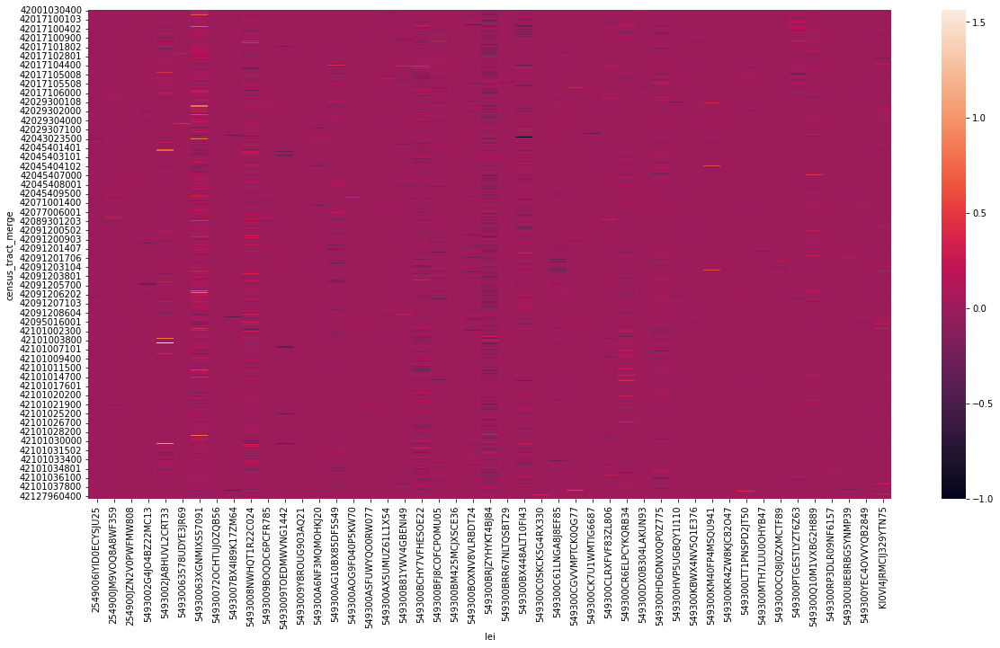

In [183]:
plt.rcParams['figure.figsize'] = [20, 10]

#Merge df with results of national average lookup on census_tract_merge and income_bin
sample_merge_lookup_all = sample_merge_clean.merge(national_average_lookup_all, on=['census_tract_merge'], how='left')

#Compute percent difference in interest rate
sample_merge_lookup_all['pct_diff_interest_rate'] = (sample_merge_lookup_all.interest_rate - sample_merge_lookup_all.average_interest_rate)/sample_merge_lookup_all.average_interest_rate

#Return dataframe with the following columns: lei, census_tract_merge, income_bin, interest_rate, average_interest_rate, pct_diff_interest_rate
cols = [
    'lei', 
    'census_tract_merge', 
    'interest_rate', 
    'average_interest_rate', 
    'pct_diff_interest_rate',
    'minority_census_tract'
]

lei = '54930063XGNMIXS57091'
final_df = sample_merge_lookup_all[cols]
final_df_subset = final_df[final_df.census_tract_merge.isin(final_df[final_df.lei == lei].census_tract_merge.unique())]
pivot1 = final_df_subset.pivot_table(index='census_tract_merge', columns='lei', values='pct_diff_interest_rate', aggfunc='mean').fillna(0)
# pivot1
sns.heatmap(pivot1)

plt.savefig('heatmap1.png', dpi=300)

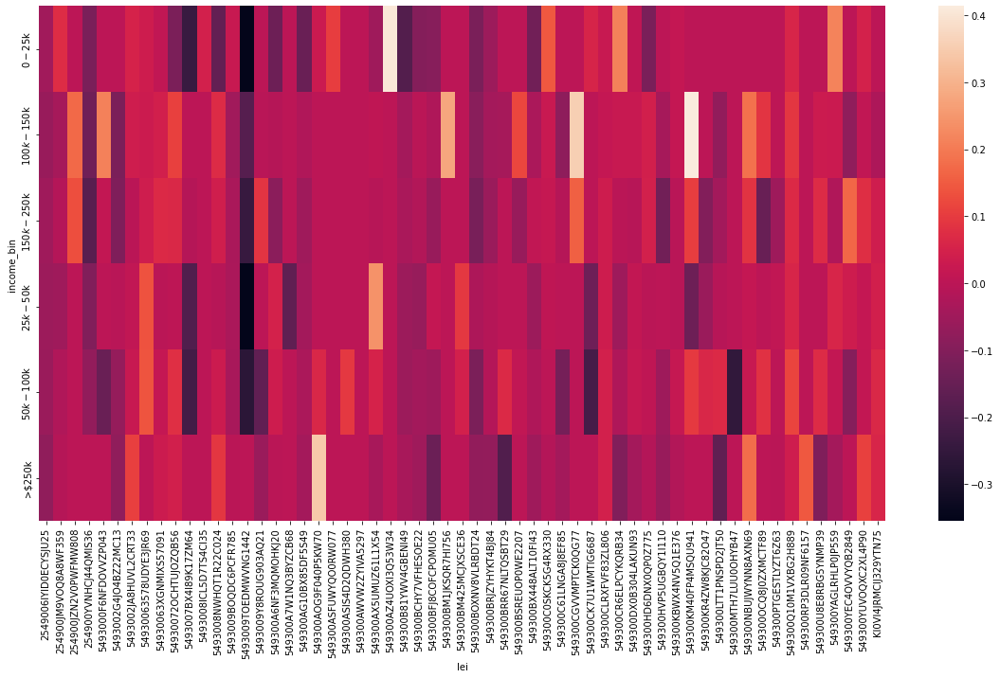

In [186]:
plt.rcParams['figure.figsize'] = [20, 10]

#Merge df with results of national average lookup on census_tract_merge and income_bin
sample_merge_lookup_all = sample_merge_clean.merge(national_average_lookup_all, on=['census_tract_merge'], how='left')

#Compute percent difference in interest rate 
sample_merge_lookup_all['pct_diff_interest_rate'] = (sample_merge_lookup_all.interest_rate - sample_merge_lookup_all.average_interest_rate)/sample_merge_lookup_all.average_interest_rate

#Return dataframe with the following columns: lei, census_tract_merge, income_bin, interest_rate, average_interest_rate, pct_diff_interest_rate
cols = [
    'lei', 
    'census_tract_merge', 
    'income_bin',
    'interest_rate', 
    'average_interest_rate', 
    'pct_diff_interest_rate',
    'minority_census_tract'
]

# lei = '54930063XGNMIXS57091'
final_df = sample_merge_lookup_all[cols]
# final_df_subset = final_df[final_df.census_tract_merge.isin(final_df[final_df.lei == lei].census_tract_merge.unique())]
pivot1 = final_df.pivot_table(index='income_bin', columns='lei', values='pct_diff_interest_rate', aggfunc='mean').fillna(0)
# pivot1
sns.heatmap(pivot1)

plt.savefig('heatmap1.png', dpi=300)

In [ ]:
final_df

# What do we want to show?

## 1. Comparison of total portfolio to PA Average

Bin income values and show average interest rate and debt-to-income ratio by the binned income

## 2. Tract by Tract comparison of total portfolio to PA Average

Same two statistics, but calculate difference from national mean for that tract, and show those values. Tracts with large differences should be flagged

## 3. Loan Portfolio by Size, Debt-to-Income Ratio, and Credit Score

Breakdown of Loan Portfolio, with comparatives to National Average.

## 4. Accepted Loans with "suspicious" income

Any large loans with low income, or extremely high debt to income ratio. Does interest rate match?

## 5. Denied Loans with suitable income

Any loans with high income, or extremely low debt to income ratio. Does interest rate match?

## 6. Loan Portfolio impact on Tract vacancy

Are any areas that have particularly high interest rates showing a similarly high rate of vacancy? Where is the most impacted area?

In [96]:
sample_hmda.interest_rate = sample_hmda.interest_rate.replace('Exempt', np.nan)
sample_hmda = sample_hmda[sample_hmda['interest_rate'].notnull()]
sample_hmda.interest_rate = sample_hmda.interest_rate.astype(np.float64)

sample_hmda.groupby(['census_tract_merge', 'lei']).mean().reset_index()

C:\Miniconda\lib\site-packages\pandas\core\generic.py:5507: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,census_tract_merge,lei,derived_msa_md,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,interest_rate,hoepa_status,income,applicant_credit_score_type
0,42001030101,549300A6NF3MQMOHKJ20,23900.0,1.0,71.000000,2.0,1.0,31.0,1.0,2.0,2.0,155000.000000,2.250000,2.0,123.0,1.0
1,42001030101,549300BRJZYHYKT4BJ84,23900.0,1.0,3.000000,2.0,1.0,32.0,1.0,2.0,2.0,145000.000000,2.625000,2.0,100.0,3.0
2,42001030102,2549006IYID0ECYSJU25,23900.0,1.0,6.000000,2.0,1.0,1.0,1.0,2.0,2.0,195000.000000,3.125000,2.0,66.0,1.0
3,42001030102,549300A6NF3MQMOHKJ20,23900.0,1.0,71.000000,2.0,1.0,32.0,1.0,2.0,2.0,235000.000000,2.625000,2.0,102.0,3.0
4,42001030102,549300BRJZYHYKT4BJ84,23900.0,1.0,1.666667,2.0,1.0,31.0,1.0,2.0,2.0,258333.333333,2.871667,2.0,98.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8772,42133024001,549300BOXNV8VLRBDT24,49620.0,1.0,1.000000,2.0,1.0,32.0,1.0,2.0,2.0,185000.000000,2.375000,2.0,111.0,1.0
8773,42133024001,549300BRJZYHYKT4BJ84,49620.0,1.0,2.000000,2.0,3.0,1.0,1.0,2.0,2.0,245000.000000,2.375000,2.0,49.0,1.0
8774,42133024001,549300BX448ALT10FI43,49620.0,1.0,6.000000,2.0,3.0,32.0,1.0,2.0,2.0,315000.000000,2.750000,2.0,117.0,1.0
8775,42133024001,549300CLRXFVF83ZL806,49620.0,1.0,1.000000,2.0,1.0,31.0,1.0,2.0,2.0,205000.000000,2.625000,2.0,140.0,7.0


In [99]:
import pandas as pd
import folium 
from folium.plugins import StripePattern
import geopandas as gpd
import numpy as np

# We import the geoJSON file. 
url = ("https://raw.githubusercontent.com/python-visualization/folium/master/examples/data")
state_geo = f"{url}/us-states.json"

# We read the file and print it.
geoJSON_df = gpd.read_file(state_geo)
geoJSON_df.head()

,id,name,geometry
0,AL,Alabama,"POLYGON ((-87.35930 35.00118, -85.60667 34.984..."
1,AK,Alaska,"MULTIPOLYGON (((-131.60202 55.11798, -131.5691..."
2,AZ,Arizona,"POLYGON ((-109.04250 37.00026, -109.04798 31.3..."
3,AR,Arkansas,"POLYGON ((-94.47384 36.50186, -90.15254 36.496..."
4,CA,California,"POLYGON ((-123.23326 42.00619, -122.37885 42.0..."


In [ ]:
url = (
    "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data"
)
state_geo = f"{url}/us-states.json"
state_unemployment = f"{url}/US_Unemployment_Oct2012.csv"
state_data = pd.read_csv(state_unemployment)

bins = list(state_data["Unemployment"].quantile([0, 0.25, 0.5, 0.75, 1]))

m = folium.Map(location=[48, -102], zoom_start=5)

folium.Choropleth(
    geo_data=state_geo,
    data=state_data,
    columns=["State", "Unemployment"],
    key_on="feature.id",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name="Unemployment Rate (%)",
    bins=bins,
    reset=True,
).add_to(m)

m

In [ ]:
# Center Map on State College, PA
center_point = [40.798214,-77.859909]
county_map = folium.Map(location=center_point, zoom_start=8)
display(county_map)

In [ ]:
def get_general_statistics(df):
    